In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu
pd.set_option('display.max_rows', None)

In [2]:
baseline = pd.read_csv('../main/log/feature_selection20241017.csv', names = ["algo", "experiment", "noise", "dataset", "seed", "generation",
                                        "training_fitness", "timing", "pop_node_count",
                                        "test_fitness","elite_size", "log"])

In [3]:
baseline.head()

,algo,experiment,noise,dataset,seed,generation,training_fitness,timing,pop_node_count,test_fitness,elite_size,log
0,SLIM*1SIG,8a68dce4-8c9b-11ef-ad90-72c976fed59c,0,yatch,0,0,15.497589,0.040851,1490.0,14.884969,7,1
1,SLIM*1SIG,8a68dce4-8c9b-11ef-ad90-72c976fed59c,0,yatch,0,1,15.381054,0.047939,1968.0,14.580240,7,1
2,SLIM*1SIG,8a68dce4-8c9b-11ef-ad90-72c976fed59c,0,yatch,0,2,15.277454,0.022558,1602.0,14.650687,13,1
3,SLIM*1SIG,8a68dce4-8c9b-11ef-ad90-72c976fed59c,0,yatch,0,3,14.775467,0.035564,2034.0,13.824715,19,1
4,SLIM*1SIG,8a68dce4-8c9b-11ef-ad90-72c976fed59c,0,yatch,0,4,14.527134,0.017816,1272.0,14.015999,17,1


In [6]:
data = pd.read_csv('../main/log/feature_selection_adptive_20241028.csv', names = ["algo", "experiment", "noise", "coefficient","dataset", "seed", "generation",
                                        "training_fitness", "timing", "pop_node_count",
                                        "test_fitness","elite_size", "log"])

In [7]:
data.head()

,algo,experiment,noise,coefficient,dataset,seed,generation,training_fitness,timing,pop_node_count,test_fitness,elite_size,log
0,SLIM*1SIG,add_noise_to_random_columns,0,0,yatch,10,0,15.495578,0.043142,1448.0,14.449910,3,1
1,SLIM*1SIG,add_noise_to_random_columns,0,0,yatch,10,1,15.088107,0.050672,1720.0,14.052659,7,1
2,SLIM*1SIG,add_noise_to_random_columns,0,0,yatch,10,2,14.431088,0.020894,1396.0,13.593802,15,1
3,SLIM*1SIG,add_noise_to_random_columns,0,0,yatch,10,3,14.431088,0.040318,1600.0,13.593802,15,1
4,SLIM*1SIG,add_noise_to_random_columns,0,0,yatch,10,4,14.431088,0.034010,1308.0,13.593802,15,1


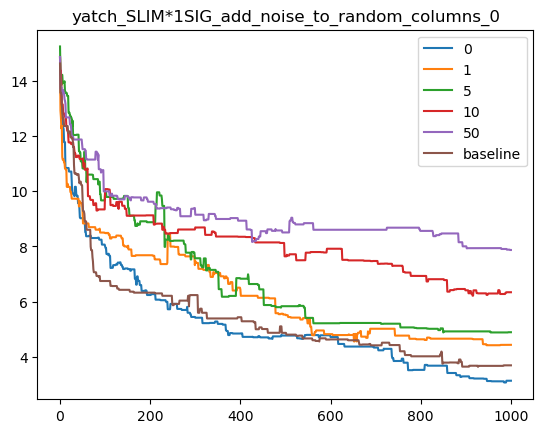

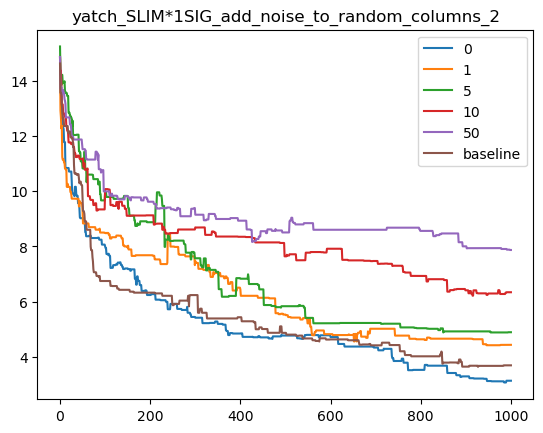

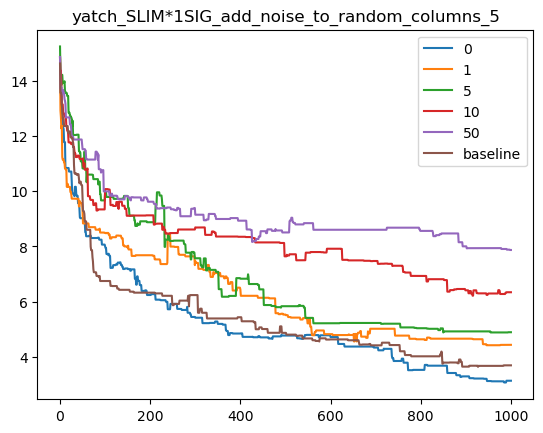

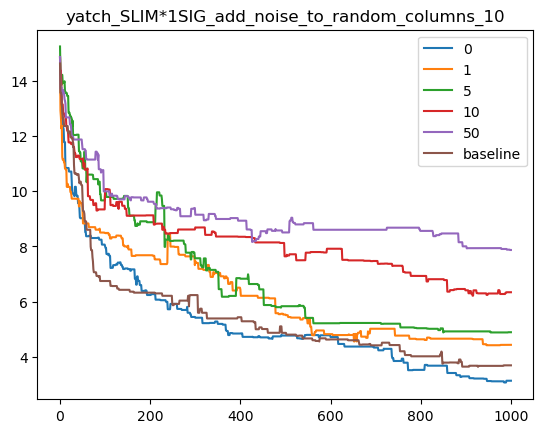

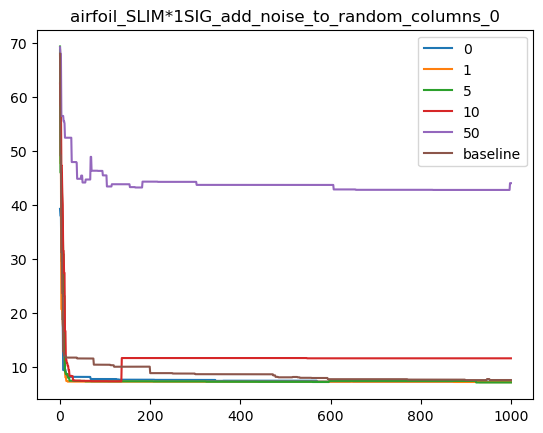

...

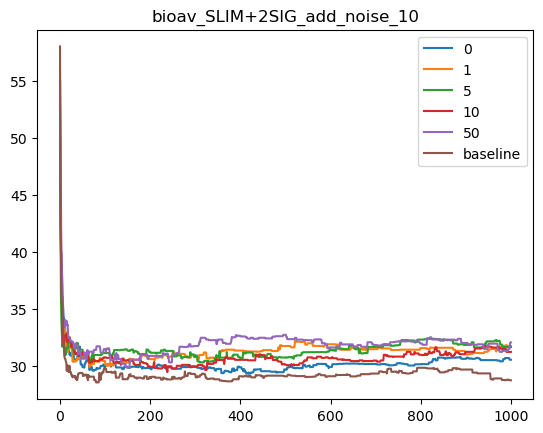

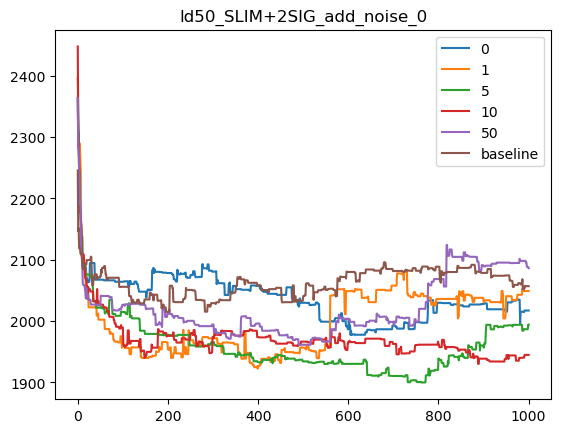

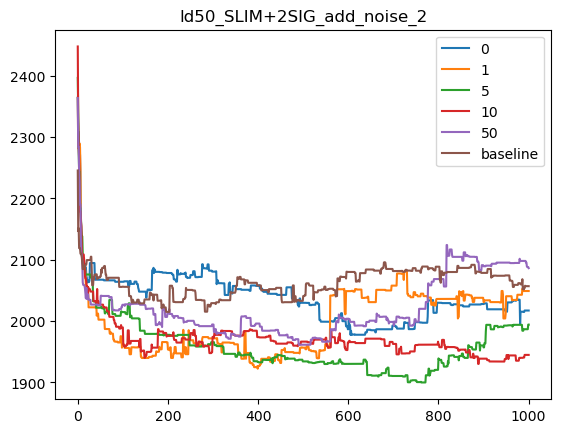

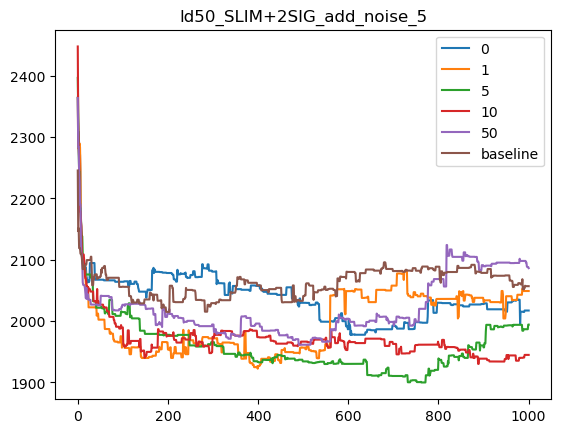

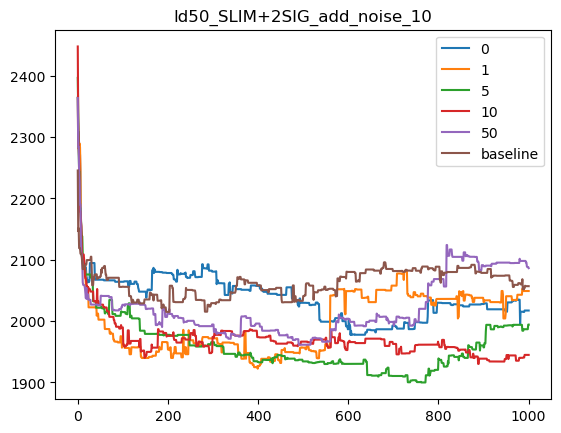

In [9]:
for experiment in data.experiment.unique():
    for algo in data.algo.unique():
        for datas in data.dataset.unique(): 
            for coeff in data.coefficient.unique():
                for noise in data.noise.unique():
                    
                    grouped = data.query("algo == @algo and dataset == @datas and noise == @noise and experiment == @experiment and coefficient == @coeff")[["generation", "test_fitness", "elite_size"]].groupby("generation").median()
                    plt.plot(grouped.index, grouped['test_fitness'].values, label = noise)
        
                
                grouped = baseline.query("algo == @algo and dataset == @datas")[["generation", "test_fitness", "elite_size"]].groupby("generation").median()
                plt.plot(grouped.index, grouped['test_fitness'].values, label = 'baseline')
        
                plt.title(f'{datas}_{algo}_{experiment}_{coeff}')
                plt.legend()
                plt.show()

In [10]:
for experiment in data.experiment.unique():
    print(experiment)
    for algo in data.algo.unique():
        print(algo)
        for datas in data.dataset.unique(): 
            print(datas)
            baseline_v = baseline.query("algo == @algo and dataset == @datas and generation == 1000")[[ "test_fitness"]].values
            for coeff in data.coefficient.unique():
                print(coeff)
                for noise in data.noise.unique():
                    
                    data_v = data.query("algo == @algo and dataset == @datas and noise == @noise and experiment == @experiment and generation == 1000 and coefficient == @coeff")[[ "test_fitness"]].values
    
                    pv = mannwhitneyu(baseline_v, data_v)[1][0]
                    ax = '' if pv > 0.05 else '*'
                
                    print(f"{noise} : {mannwhitneyu(baseline_v, data_v)[1][0]}{ax}")
            print('\n')

add_noise_to_random_columns
SLIM*1SIG
yatch
0
0 : 0.24132159301718004
1 : 0.3074894566186813
5 : 0.03763531378731424*
10 : 0.10410988966022681
50 : 0.0017062493689195964*
2
0 : 0.24132159301718004
1 : 0.3074894566186813
5 : 0.03763531378731424*
10 : 0.10410988966022681
50 : 0.0017062493689195964*
5
0 : 0.24132159301718004
1 : 0.3074894566186813
5 : 0.03763531378731424*
10 : 0.10410988966022681
50 : 0.0017062493689195964*
10
0 : 0.24132159301718004
1 : 0.3074894566186813
5 : 0.03763531378731424*
10 : 0.10410988966022681
50 : 0.0017062493689195964*


airfoil
0
0 : 0.21229383619233155
1 : 0.3447042220069576
5 : 0.3074894566186813
10 : 0.12122450301291662
50 : 0.0007685389131627665*
2
0 : 0.21229383619233155
1 : 0.3447042220069576
5 : 0.3074894566186813
10 : 0.12122450301291662
50 : 0.0007685389131627665*
5
0 : 0.21229383619233155
1 : 0.3447042220069576
5 : 0.3074894566186813
10 : 0.12122450301291662
50 : 0.0007685389131627665*
10
0 : 0.21229383619233155
1 : 0.3447042220069576
5 : 0.307489

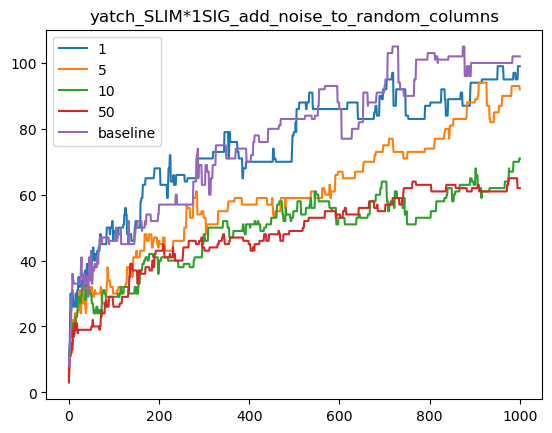

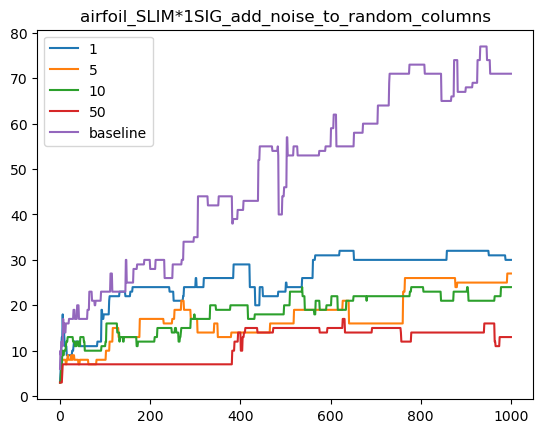

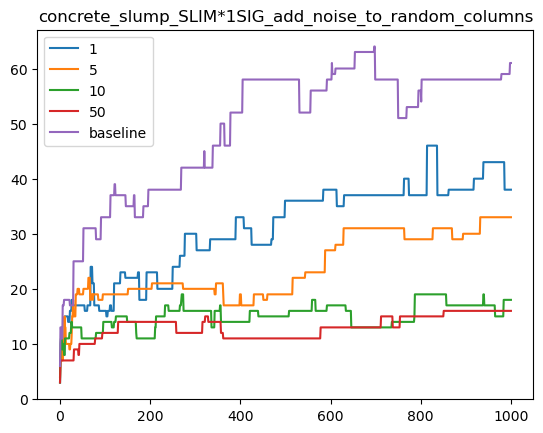

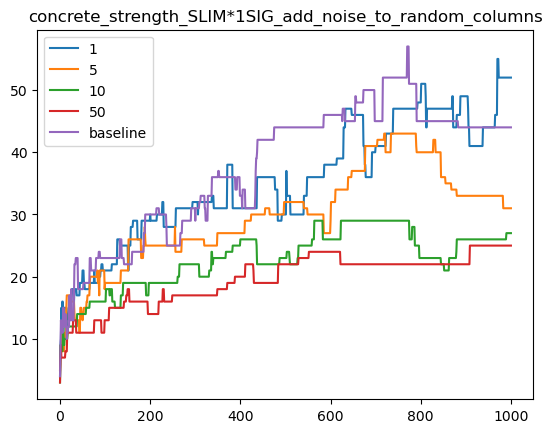

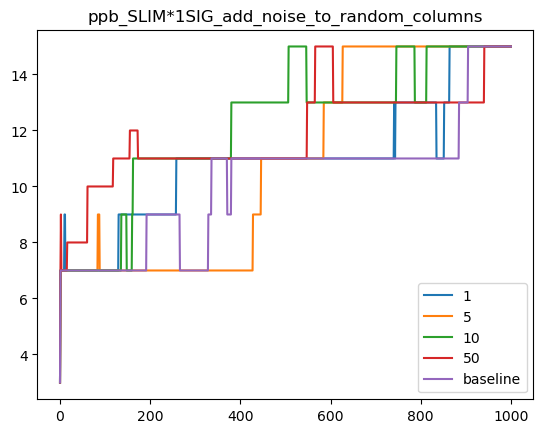

...

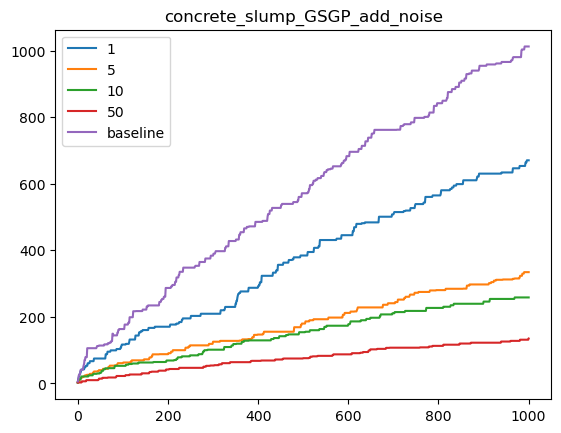

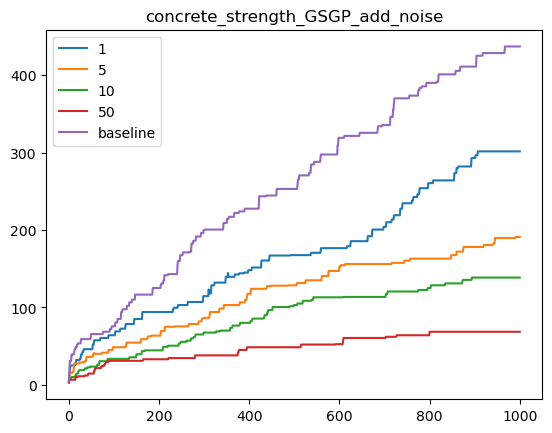

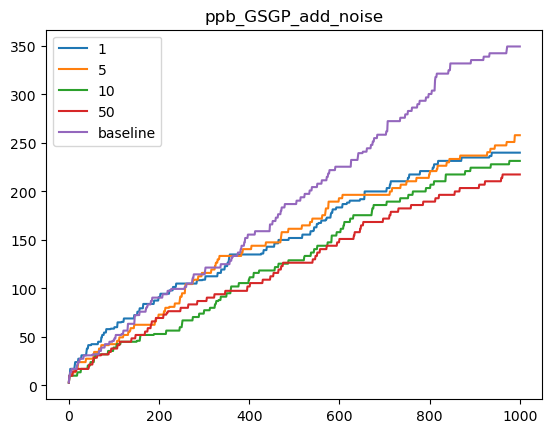

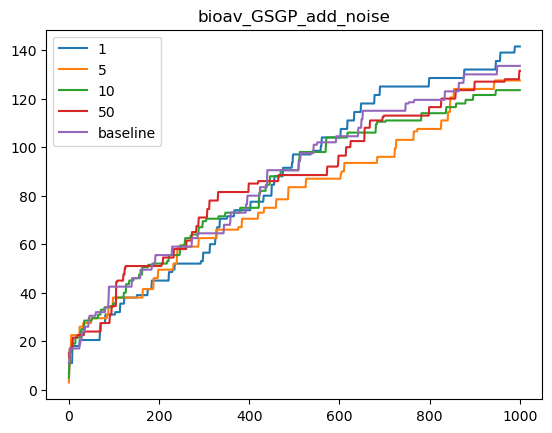

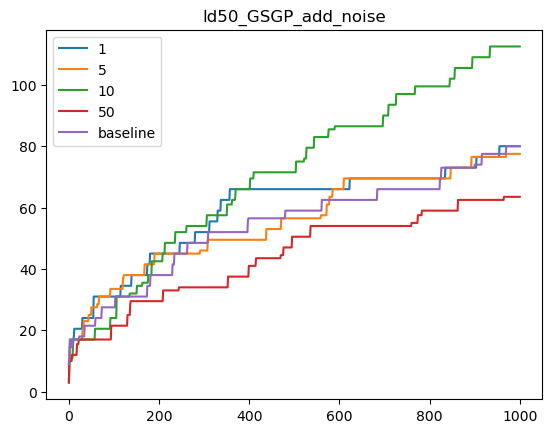

In [19]:
for experiment in data.experiment.unique():
    for algo in data.algo.unique():
        for datas in data.dataset.unique(): 
            for noise in data.noise.unique():
                
                grouped = data.query("algo == @algo and dataset == @datas and noise == @noise and experiment == @experiment")[["generation", "test_fitness", "elite_size"]].groupby("generation").median()
                plt.plot(grouped.index, grouped['elite_size'].values, label = noise)
    
            
            grouped = baseline.query("algo == @algo and dataset == @datas")[["generation", "test_fitness", "elite_size"]].groupby("generation").median()
            plt.plot(grouped.index, grouped['elite_size'].values, label = 'baseline')
    
            plt.title(f'{datas}_{algo}_{experiment}')
            plt.legend()
            plt.show()

In [65]:
counts = pd.read_csv('../main/log/_20241018.csv', names = ["algo", "experiment_id", "noise", "dataset", "counts_v", "experiment"], converters={'counts_v': lambda x: x[1:-1].split(',')})

In [66]:
counts["count_v"] = counts.counts_v.apply(lambda x: sum([int(el) for el in x]))

In [68]:
grouped = counts[["experiment", "dataset",   "noise", "algo", "count_v"]].groupby(["experiment", "dataset",   "noise", "algo"]).median()

In [69]:
grouped

count_v
experiment                  dataset           noise algo              
add_noise                   airfoil           1     GSGP          14.0
                                                    SLIM*1SIG      1.5
                                                    SLIM*ABS       0.0
                                                    SLIM+2SIG      7.0
                                              5     GSGP          13.5
                                                    SLIM*1SIG      4.0
                                                    SLIM*ABS       2.5
                                                    SLIM+2SIG     18.5
                                              10    GSGP          15.0
                                                    SLIM*1SIG      3.0
                                                    SLIM*ABS       2.0
                                                    SLIM+2SIG     17.5
                                              50    GSGP          11.5
                                                    SLIM*1SIG      3.5
                                                    SLIM*ABS       2.0
                                                    SLIM+2SIG     23.0
                            bioav             1     GSGP           0.0
                                                    SLIM*1SIG      0.0
                                                    SLIM*ABS       0.0
                                                    SLIM+2SIG      0.5
                                              5     GSGP           0.5
                                                    SLIM*1SIG      0.0
                                                    SLIM*ABS       0.0
                                                    SLIM+2SIG      3.0
                                              10    GSGP           1.0
                                                    SLIM*1SIG      0.0
                                                    SLIM*ABS       0.0
                                                    SLIM+2SIG      4.5
                                              50    GSGP           8.0
                                                    SLIM*1SIG      0.5
                                                    SLIM*ABS       1.0
                                                    SLIM+2SIG     22.0
                            concrete_slump    1     GSGP          38.0
                                                    SLIM*1SIG      3.5
                                                    SLIM*ABS       2.0
                                                    SLIM+2SIG     12.0
                                              5     GSGP          67.0
                                                    SLIM*1SIG      8.0
                                                    SLIM*ABS       2.0
                                                    SLIM+2SIG     52.0
                                              10    GSGP          70.5
                                                    SLIM*1SIG     11.0
                                                    SLIM*ABS       4.0
                                                    SLIM+2SIG     69.5
                                              50    GSGP          68.0
                                                    SLIM*1SIG      8.5
                                                    SLIM*ABS       4.0
                                                    SLIM+2SIG    100.0
                            concrete_strength 1     GSGP          15.0
                                                    SLIM*1SIG      2.5
                                                    SLIM*ABS       1.0
                                                    SLIM+2SIG     23.0
                                              5     GSGP          33.0
                                                    SLIM*1SIG      4.0
                                                    SLIM*ABS       4.5
                